array([[-3.53589410e-03, -1.75959878e-02,  0.00000000e+00],
       [-1.13611891e-02, -1.50626130e-02,  0.00000000e+00],
       [-2.03167442e-02, -1.27713526e-02,  0.00000000e+00],
       ...,
       [-1.24660672e-02, -8.95707289e-03,  0.00000000e+00],
       [-1.43769488e-02, -1.65311341e-02,  0.00000000e+00],
       [-2.14223075e+01,  7.06313787e+01,  1.00000000e+00]])

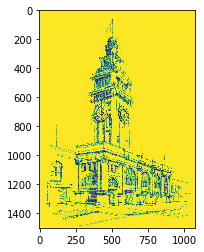

In [7]:
import tensorflow as tf
import numpy as np
import os
import svgwrite
from six.moves import xrange
from IPython.display import SVG, display
import PIL
from PIL import Image
import matplotlib.pyplot as plt
from xml.dom import minidom
from PIL import Image
import numpy as np
import potrace
from magenta.models.sketch_rnn.sketch_rnn_train import *
from magenta.models.sketch_rnn.model import *
from magenta.models.sketch_rnn.utils import *
from magenta.models.sketch_rnn.rnn import *

# In[4]:


def draw_strokes(data, factor=0.2, svg_filename = './reconstructed.svg'):
    """little function that displays vector images and saves them to .svg"""
    tf.gfile.MakeDirs(os.path.dirname(svg_filename))
    min_x, max_x, min_y, max_y = get_bounds(data, factor)
    dims = (50 + max_x - min_x, 50 + max_y - min_y)
    dwg = svgwrite.Drawing(svg_filename, size=dims)
    dwg.add(dwg.rect(insert=(0, 0), size=dims,fill='white'))
    lift_pen = 1
    abs_x = 25 - min_x 
    abs_y = 25 - min_y
    p = "M%s,%s " % (abs_x, abs_y)
    command = "m"
    for i in xrange(len(data)):
        if (lift_pen == 1):
            command = "m"
        elif (command != "l"):
            command = "l"
        else:
            command = ""
        x = float(data[i,0])/factor
        y = float(data[i,1])/factor
        lift_pen = data[i, 2]
        p += command+str(x)+","+str(y)+" "
    the_color = "black"
    stroke_width = 1
    dwg.add(dwg.path(p).stroke(the_color,stroke_width).fill("none"))
    dwg.save()
    display(SVG(dwg.tostring()))


# In[5]:


def png2bmp(directory,filename):
    """reads in the png file and saves it as a bmp. Also loads it to a numpy array and returns it"""
    
    img = Image.open(directory+ filename).convert('L')
    bitmap = np.array(img)
    im = Image.fromarray(bitmap.astype(np.uint8))
    im.save(directory+filename.split('.')[0]+'.bmp')
    bitmap = np.divide(bitmap, np.max(bitmap))
    return bitmap


# In[6]:


def quadraticBezierCurve2LineSegments(s,c1,c2,e,approximation):
    '''𝐂(𝑡)=(1−𝑡)3𝐏0+3𝑡(1−𝑡)2𝐏1+3𝑡2(1−𝑡)𝐏2+𝑡3𝐏3'''
    
    curve_points=[]
    for point in range(approximation):
        t=point/(approximation-1)
        linear_comb=[0,0,0]
        linear_comb[0]=((1-t)**3)*s[0] + (3*t*(1-t)**2)*c1[0] + (3*(t**2)*(1-t))*c2[0] + (t**3)*e[0]
        linear_comb[1]=((1-t)**3)*s[1] + (3*t*(1-t)**2)*c1[1] + (3*(t**2)*(1-t))*c2[1]+ (t**3)*e[1]
        curve_points.append(linear_comb)

    return curve_points


# In[55]:


def is_frame(start, corner, end , data):
    def equal(p1,p2):
        if p1[0]!=p2[0] or p1[1]!=p2[1]:
            return False
        return True
    
    frame_point = [(0.0, 0.0),( 0.0, data.shape[0]),(data.shape[1],0.0), (data.shape[1],data.shape[0])]
    for point in frame_point:
        if equal(start,point) or  equal(corner,point) or equal(end,point):
            return True
    return False
        
def path2points(data,approximation):
    bmp = potrace.Bitmap(data)
    path = bmp.trace()
    all_point=[]

    for i,curve in enumerate(path):
        start_point=curve.start_point
        for j,segment in enumerate(curve.segments):
            end_point_x, end_point_y = segment.end_point
            if segment.is_corner:
                c_x, c_y = segment.c

                if not is_frame(start_point,segment.c, segment.end_point, data):
                    all_point += [list(start_point)+[1 if (j==0) else 0],
                                  list(segment.c)+[0],
                                  list(segment.end_point)+[0]]
 
            else:
                c1_x, c1_y = segment.c1
                c2_x, c2_y = segment.c2
                segment_points = quadraticBezierCurve2LineSegments(start_point,segment.c1,segment.c2,segment.end_point,approximation)
                segment_points[0][2] = 1 if (j==0) else 0 
                all_point += segment_points

            start_point = segment.end_point
    return all_point
    


# In[56]:


def points2strok3(all_points,scale_factor=1):
    strok3 = []
    prev_point = [0,0,1]
    starting_point=None
    for i, point in enumerate(all_points): 
        if not starting_point:
            starting_point = point
        if i<len(all_points)-1:
            strok3.append([point[0] - prev_point[0], point[1] - prev_point[1], int(all_points[i+1][2])])
        prev_point = point
    strok3[-1][2] = 0
    strok3.append([starting_point[0] - point[0] , starting_point[1] - point[1], 1])        
    strok3=np.array(strok3)/np.array([scale_factor,scale_factor,1])        
    return strok3


# In[60]:


def add_padding(data):
    padded_data = np.ones((data.shape[0]+2,data.shape[1]+2))
    for i in range(1,padded_data.shape[0]-1):
        if i!=0 or i!=len(padded_data)-1:
            padded_data[i,1:data.shape[1]+1] = data[i-1,:]
    return padded_data


# In[61]:


def png2svg(directory,filename, scale_factor=1, approximation=10):
    data = png2bmp(directory,filename)
    data = add_padding(data)
    plt.imshow(data)
    all_points = path2points(data,approximation)
    strok3 = points2strok3(all_points,scale_factor)[1:]
    draw_strokes(strok3,svg_filename = directory+filename.split('.')[0]+".svg",factor=0.2)        
    return strok3

# In[62]:


directory = "../img/"
filename = "buildingSketch.jpg"
png2svg(directory,filename,scale_factor=20)